# Image filtering and edge detection

Used packages

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as col
import matplotlib.image as mpimg
from scipy import signal
from scipy import ndimage

def rgb2gray(rgb_image):
    return np.dot(rgb_image[...,:3], [0.299, 0.587, 0.114])



## Load the image

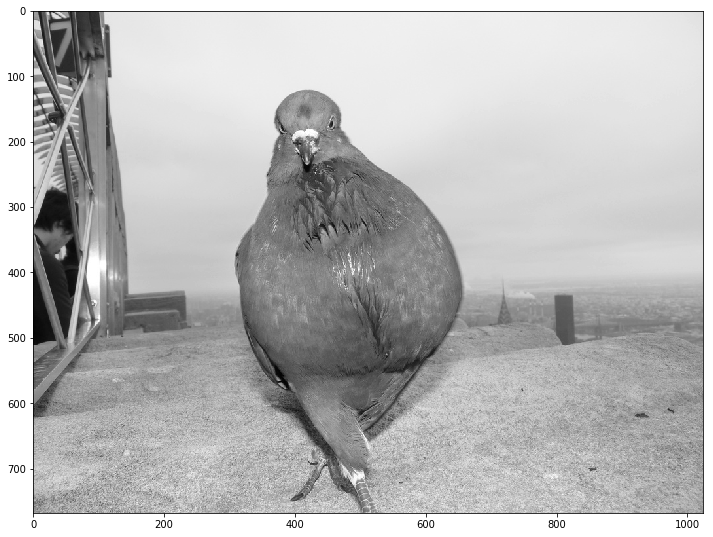

In [26]:
image = mpimg.imread("images/pegion.jpg")
image_gr = rgb2gray( image )

figureSize = (12,10)
plt.figure("Original Image", figsize=figureSize)
plt.imshow(image_gr)
plt.set_cmap("gray")


## Adding Noise to the Image 
Changing weight will change the noise in the image

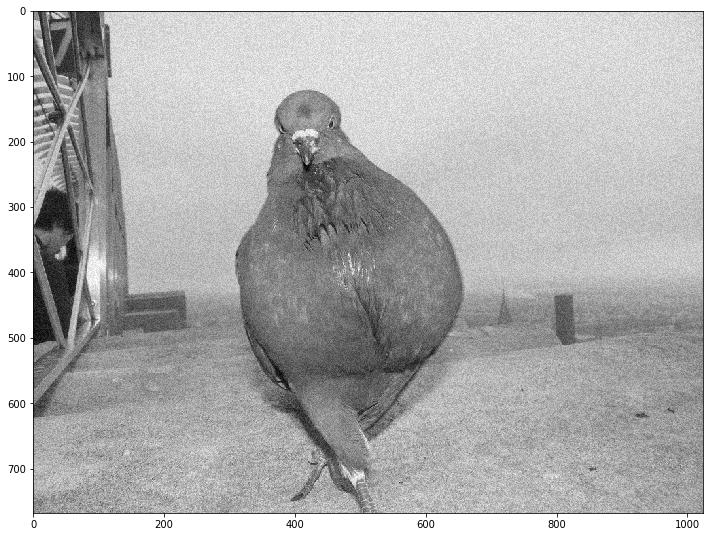

In [8]:
weight = 0.9
noisy = image_gr + weight * image_gr.std() * np.random.random(image_gr.shape)
plt.figure("Noisy Image", figsize=figureSize)
plt.imshow(noisy)


## Image Denoising 


 **Average Filter** 

w represent the width of the average filter


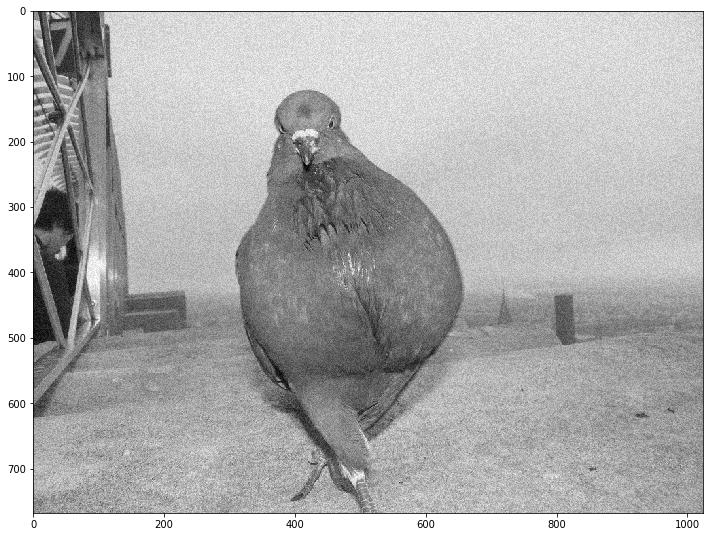

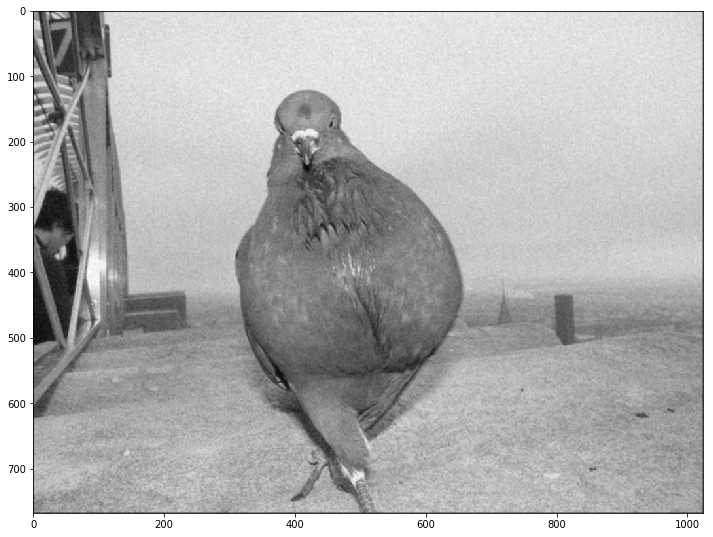

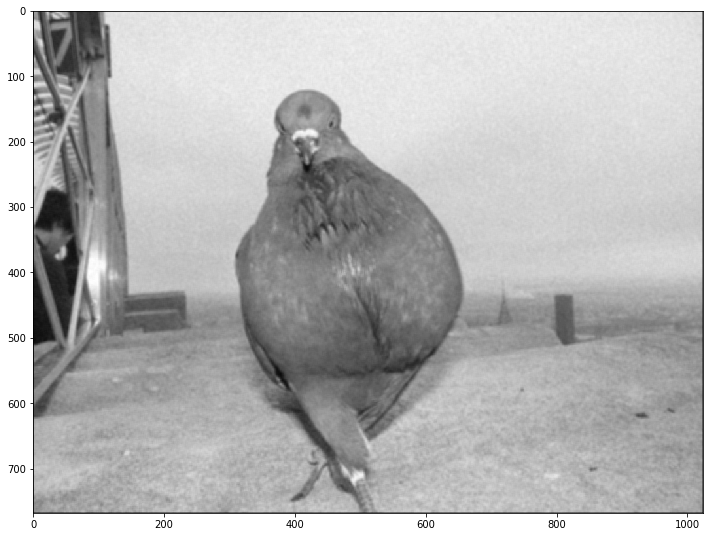

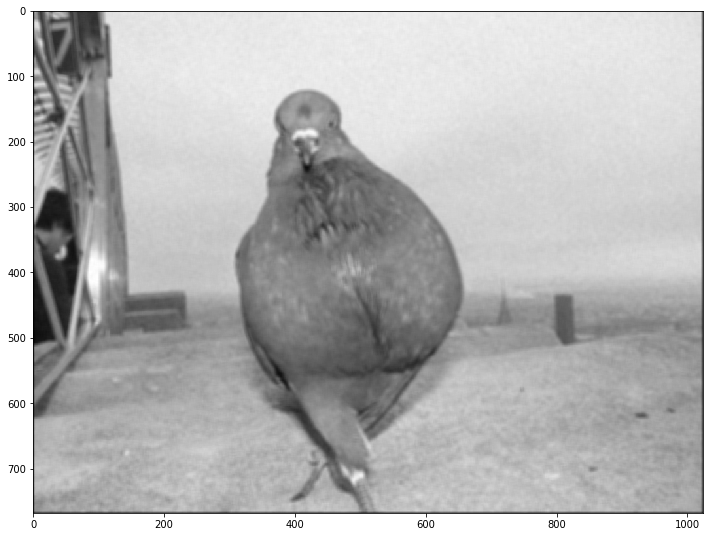

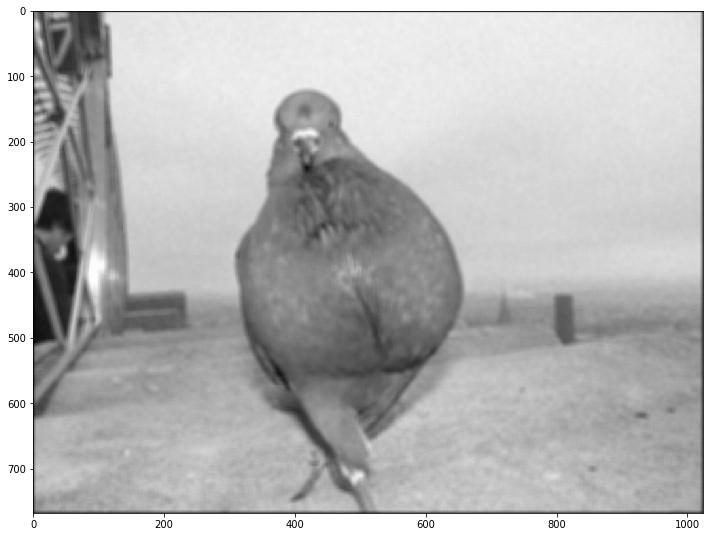

In [9]:
def box_filter( w ):
    return np.ones((w,w)) / (w*w)
    

filtered_img_box1 = signal.convolve2d(noisy, box_filter( 1 ) ,'same')
filtered_img_box3 = signal.convolve2d(noisy, box_filter( 3 ) ,'same')
filtered_img_box5 = signal.convolve2d(noisy, box_filter( 5 ) ,'same')
filtered_img_box7 = signal.convolve2d(noisy, box_filter( 7 ) ,'same')
filtered_img_box9 = signal.convolve2d(noisy, box_filter( 9 ) ,'same')

plt.figure("1",figsize=figureSize)
plt.imshow(filtered_img_box1)

plt.figure("3",figsize=figureSize)
plt.imshow(filtered_img_box3)

plt.figure("5",figsize=figureSize)
plt.imshow(filtered_img_box5)

plt.figure("7",figsize=figureSize)
plt.imshow(filtered_img_box7)

plt.figure("9",figsize=figureSize)
plt.imshow(filtered_img_box9)


In [5]:
print(box_filter(3))

[[0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]]


 **Gaussian Filter** 

$\sigma$ is the standard devaition 


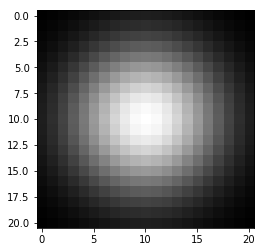

In [13]:
import numpy as np
from scipy import signal

def gaussian_kernel( kernlen , std ):
    """Returns a 2D Gaussian kernel array."""
    gkern1d = signal.gaussian(kernlen, std=std).reshape(kernlen, 1)
    gkern2d = np.outer(gkern1d, gkern1d)
    return gkern2d

plt.imshow(gaussian_kernel(21,5), interpolation='none')


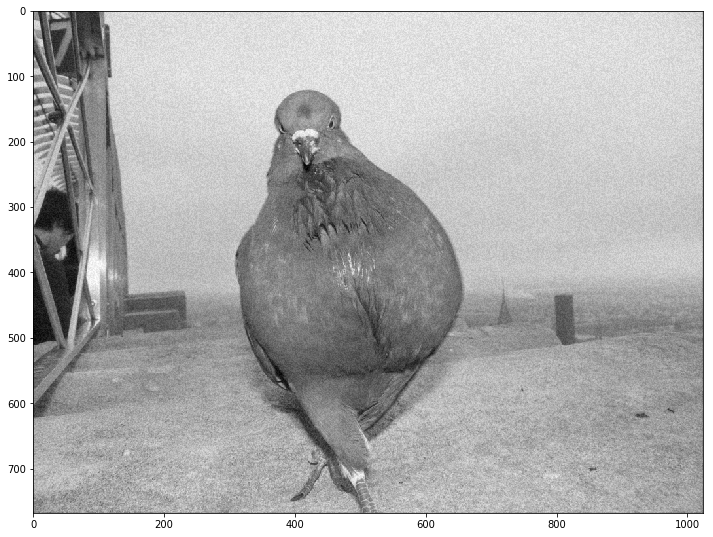

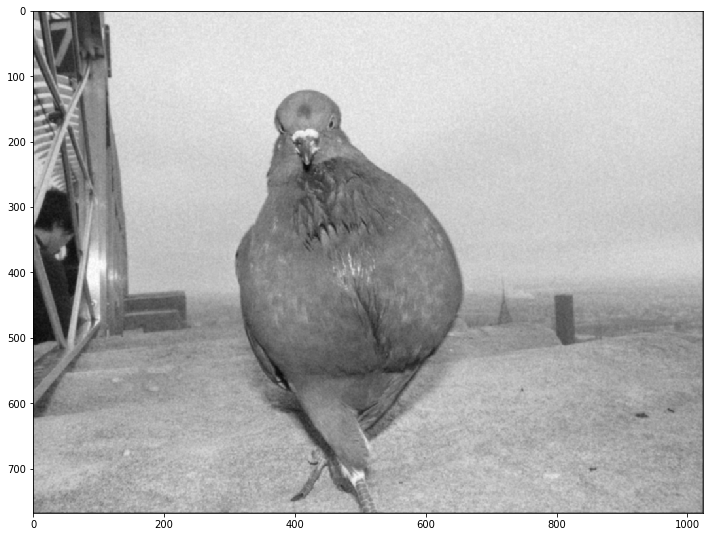

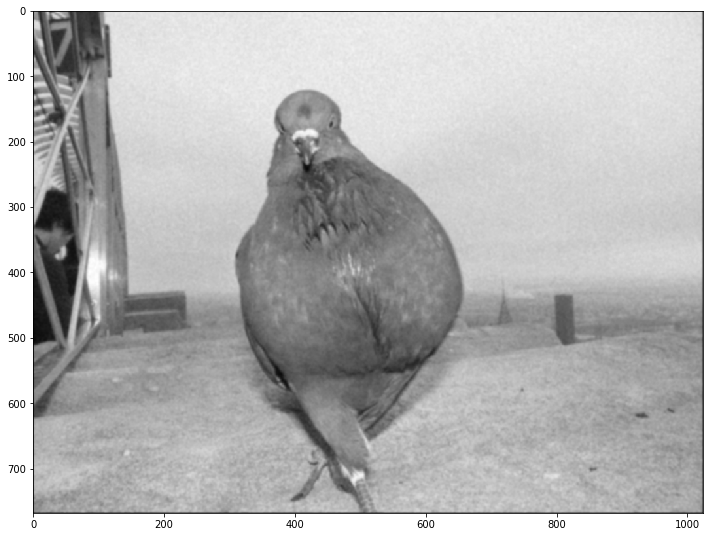

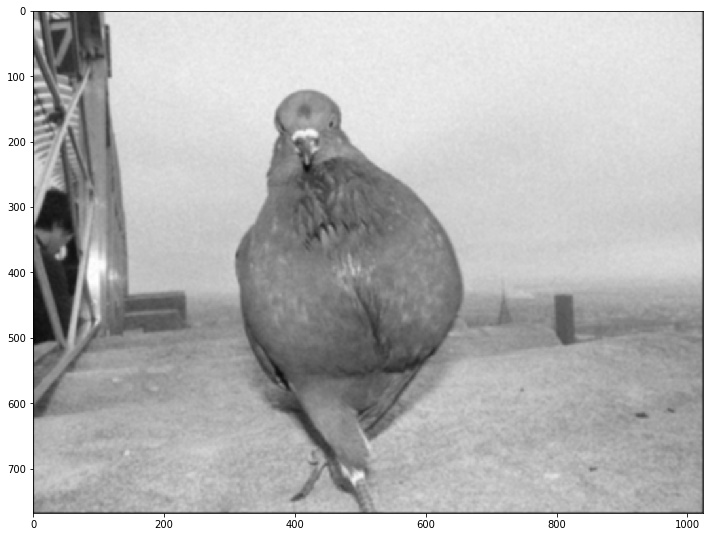

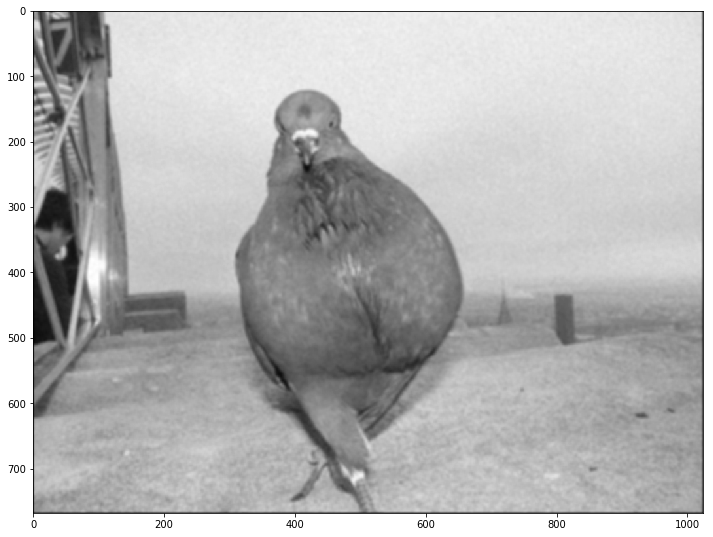

In [15]:
filtered_img_g7_std05 = signal.convolve2d(noisy, gaussian_kernel(7,0.5) ,'same')
filtered_img_g7_std10 = signal.convolve2d(noisy, gaussian_kernel(7,1.0) ,'same')
filtered_img_g7_std15 = signal.convolve2d(noisy, gaussian_kernel(7,1.5) ,'same')
filtered_img_g7_std20 = signal.convolve2d(noisy, gaussian_kernel(7,2) ,'same')
filtered_img_g7_std25 = signal.convolve2d(noisy, gaussian_kernel(7,2.5) ,'same')

plt.figure("1",figsize=figureSize)
plt.imshow(filtered_img_g7_std05)

plt.figure("3",figsize=figureSize)
plt.imshow(filtered_img_g7_std10)

plt.figure("5",figsize=figureSize)
plt.imshow(filtered_img_g7_std15)

plt.figure("7",figsize=figureSize)
plt.imshow(filtered_img_g7_std20)

plt.figure("9",figsize=figureSize)
plt.imshow(filtered_img_g7_std25)


**Median Filter**

s is the parameter that identify the size of the mask

Lets try different values :)

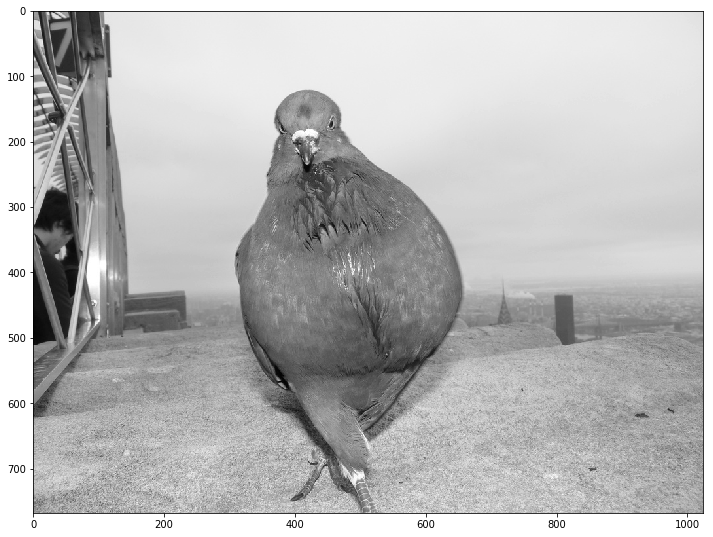

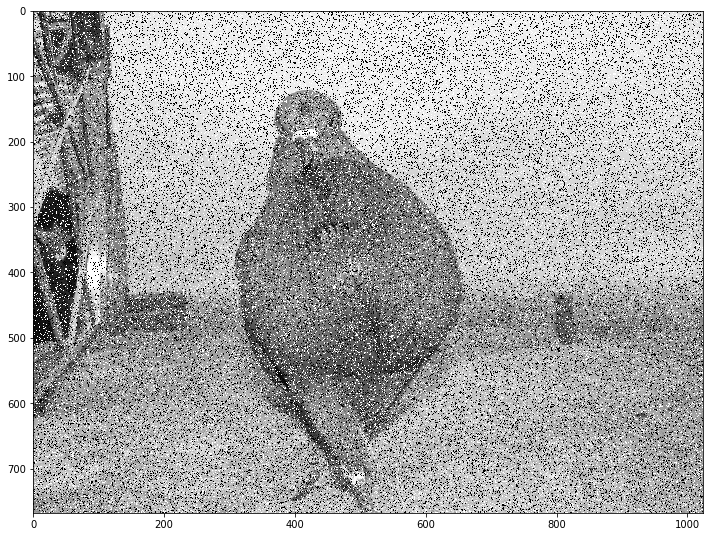

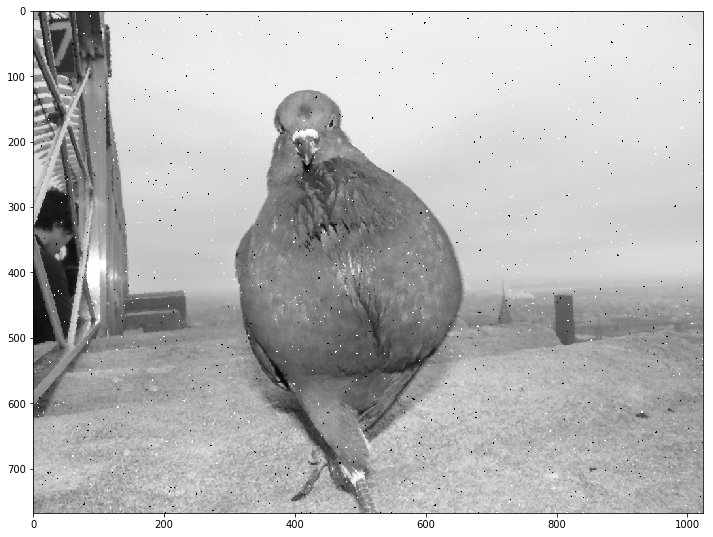

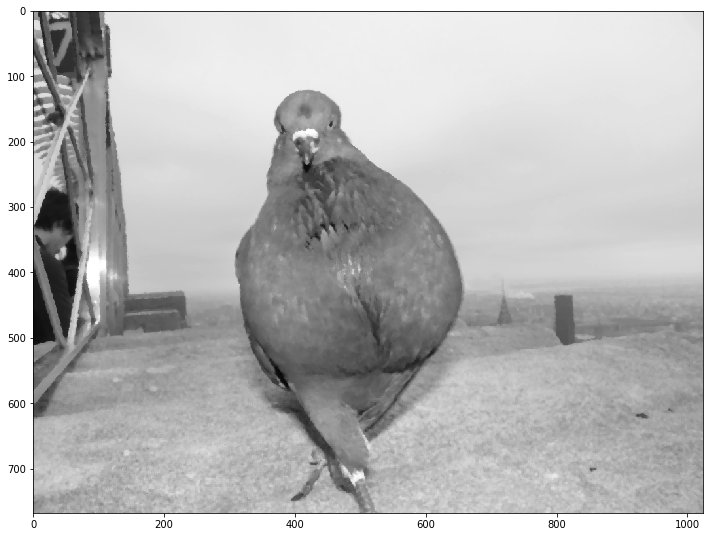

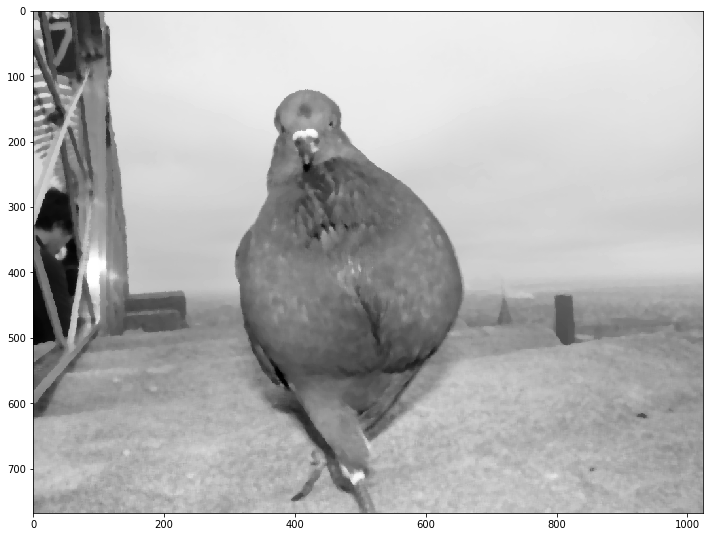

In [19]:
def salt_n_pepper(img):
    salt_pepper = np.random.random(img.shape) * 255

    pepper = salt_pepper < 30;
    salt = salt_pepper > 225;

    img[pepper] = 0
    img[salt] = 255

    return img

plt.figure("Original image", figsize=figureSize)
plt.imshow(image_gr)

image_noisy_salt_pepper = salt_n_pepper( image_gr )
plt.figure("Salt and pepper", figsize=figureSize)
plt.imshow( image_noisy_salt_pepper )

med_image3 = ndimage.median_filter(image_noisy_salt_pepper,(3,3))
med_image5 = ndimage.median_filter(image_noisy_salt_pepper,(5,5))
med_image7 = ndimage.median_filter(image_noisy_salt_pepper,(7,7))

plt.figure("Median Filter 3x3", figsize=figureSize)
plt.imshow(med_image3)

plt.figure("Median Filter 5x5", figsize=figureSize)
plt.imshow(med_image5)

plt.figure("Median Filter 7x7", figsize=figureSize)
plt.imshow(med_image7)

## Edge Detection

### Some famous kernels

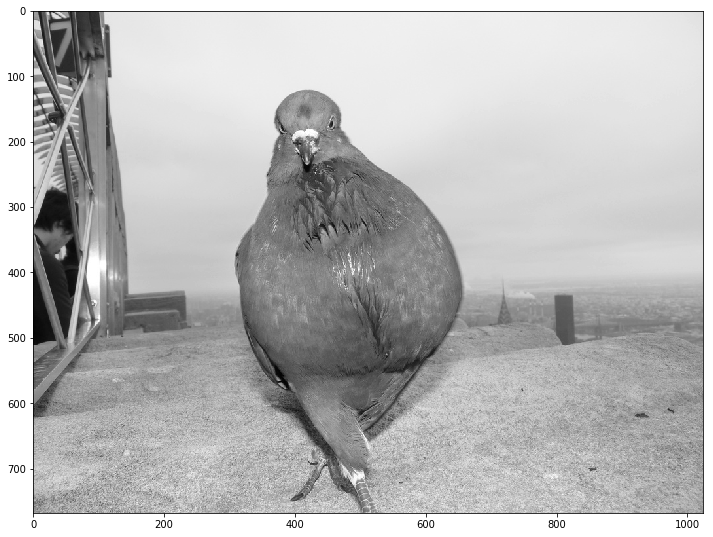

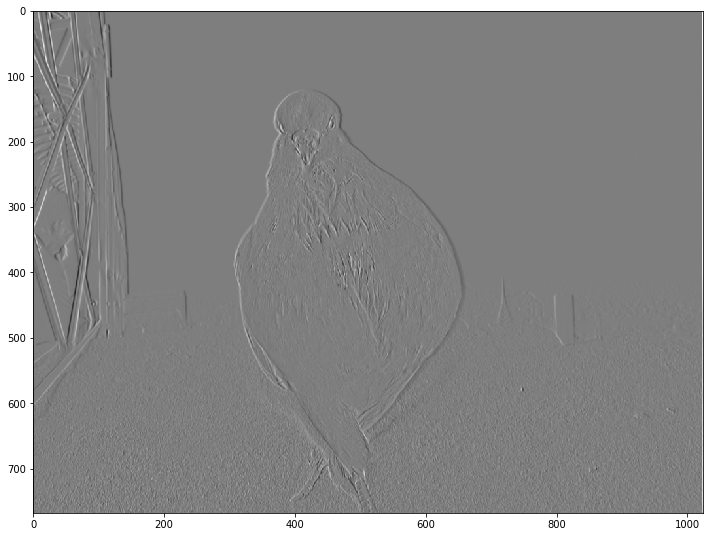

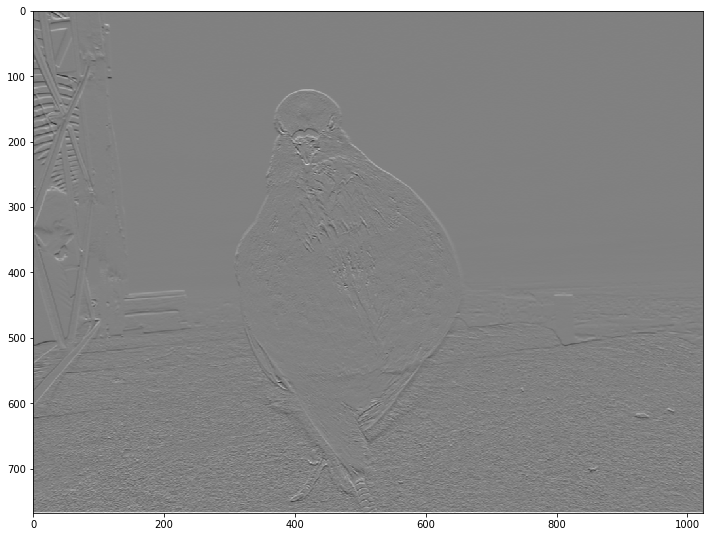

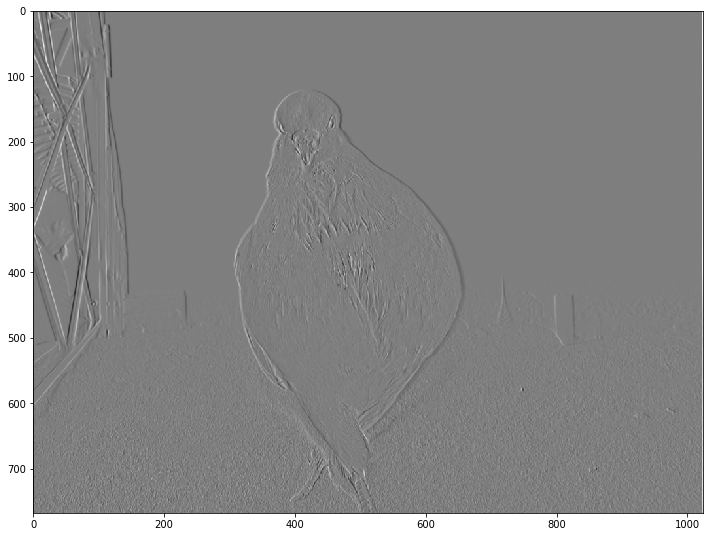

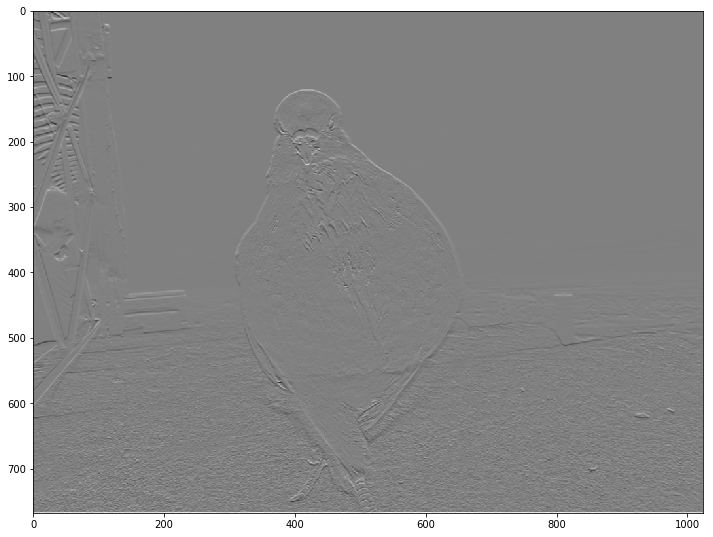

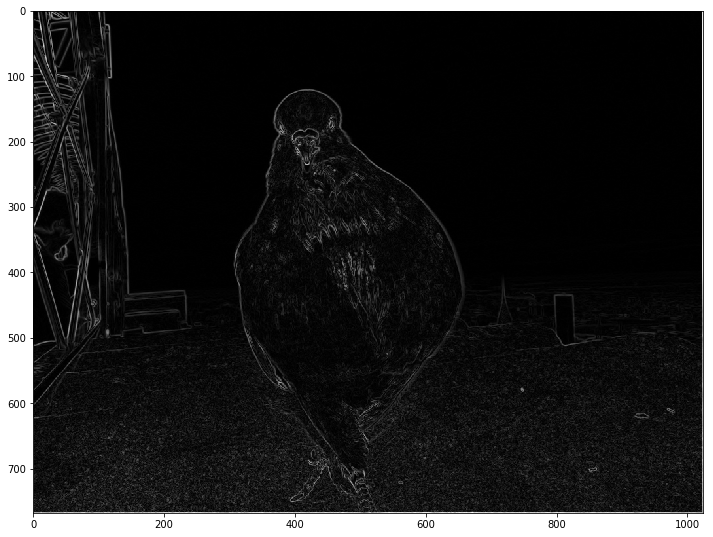

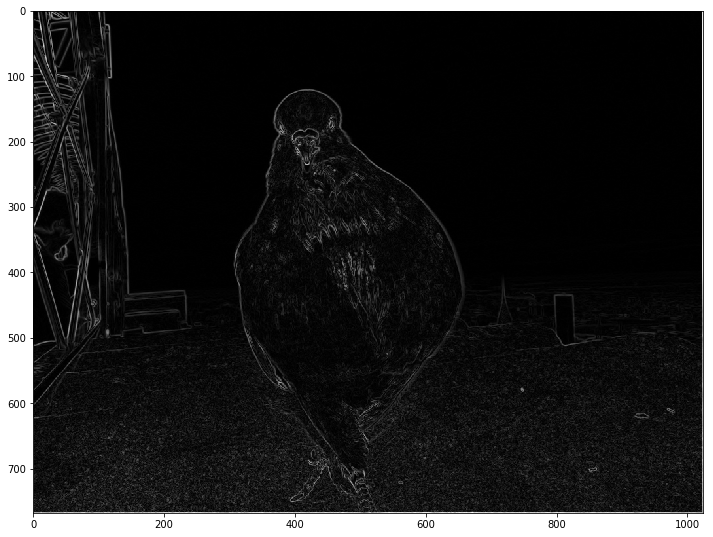

In [31]:
prewitt_h = np.array([[ -1 , 0 , 1 ] ,
                      [ -1 , 0 , 1 ] ,
                      [ -1 , 0 , 1 ] ])
prewitt_v = prewitt_h.transpose()


sobel_h = np.array([[ -1 , 0 , 1 ] ,
                    [ -2 , 0 , 2 ] ,
                    [ -1 , 0 , 1 ]])
sobel_v = sobel_h.transpose()

def gradient_sobel( img ):
    image_sobel_h = signal.convolve2d( img , sobel_h ,'same')
    image_sobel_v = signal.convolve2d( img , sobel_v ,'same')
    phase = np.arctan2(image_sobel_h , image_sobel_v) * (180.0 / np.pi)

    # Assign phase values to nearest [ 0 , 45 , 90 ,  135 ]
    phase = ((45 * np.round(phase / 45.0)) + 180) % 180;

    gradient = np.sqrt(image_sobel_h * image_sobel_h + image_sobel_v * image_sobel_v)
    return gradient, phase


image_gr_norm = image_gr / 255.
image_prewit_h = signal.convolve2d( image_gr_norm , prewitt_h ,'same')
image_prewit_v = signal.convolve2d( image_gr_norm , prewitt_v ,'same')

image_sobel_h = signal.convolve2d( image_gr_norm , sobel_h ,'same')
image_sobel_v = signal.convolve2d( image_gr_norm , sobel_v ,'same')

image_sobel_gradient, image_sobel_phase = gradient_sobel( image_gr_norm )

def rescale( img ):
    return (img - img.min()) / (img.max() - img.min()) * 255

plt.figure("Original", figsize=figureSize)
plt.imshow(image_gr_norm)

plt.figure("Prewit horizontal", figsize=figureSize)
plt.imshow(image_prewit_h)

plt.figure("Prewit vertical", figsize=figureSize)
plt.imshow(image_prewit_v)

plt.figure("Sobel horizontal", figsize=figureSize)
plt.imshow(image_sobel_h)

plt.figure("Sobel vertical", figsize=figureSize)
plt.imshow(image_sobel_v)

plt.figure("Sobel gradient", figsize=figureSize)
plt.imshow(image_sobel_gradient)

plt.figure("Sobel phase", figsize=figureSize)
plt.imshow(image_sobel_gradient)

**Load Another Image**

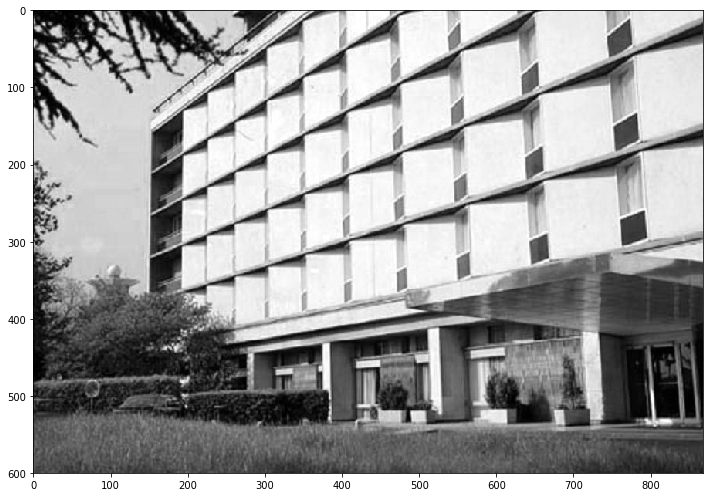

In [10]:
lines = mpimg.imread("images/Lines.jpg")
linesVChannel = extractValueChannel(lines)
plt.figure("Original Image", figsize=figureSize)
plt.imshow(linesVChannel)
plt.set_cmap("gray")

**Sobel in x Direction**

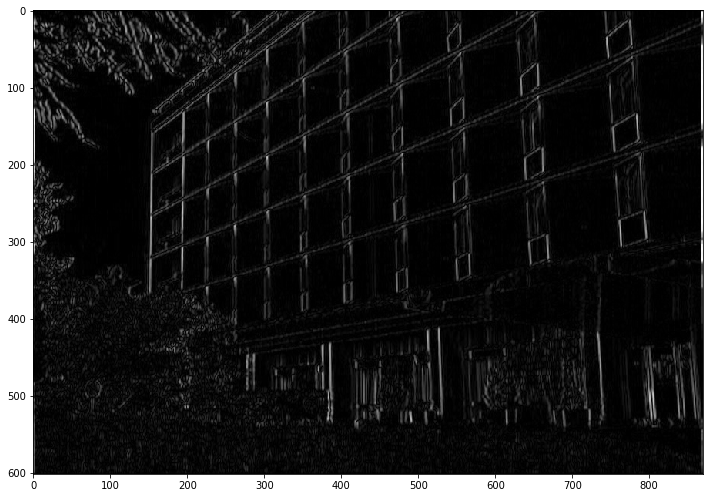

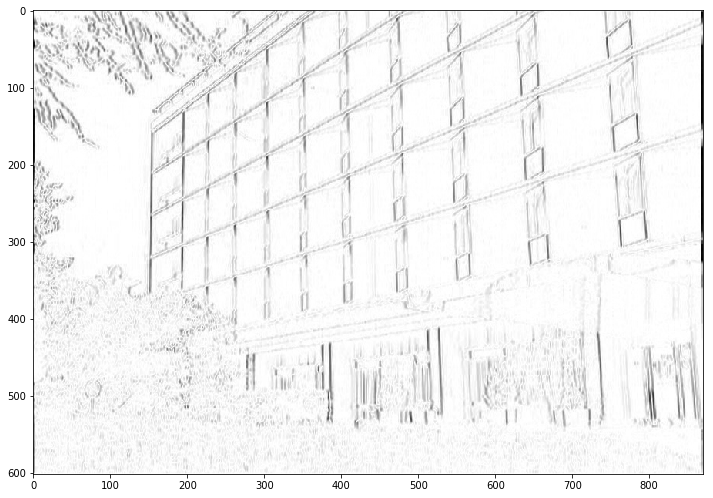

In [15]:
Ix = signal.convolve2d(linesVChannel, Sobelx)
plt.figure("Sobel in x direction", figsize=figureSize)
plt.imshow(np.abs(Ix))
plt.set_cmap("gray")
# We can invert the image 
plt.figure("Sobel in x direction (inverted)", figsize=figureSize)
plt.imshow(255-np.abs(Ix))
plt.set_cmap("gray")

**Sobel in y Direction**

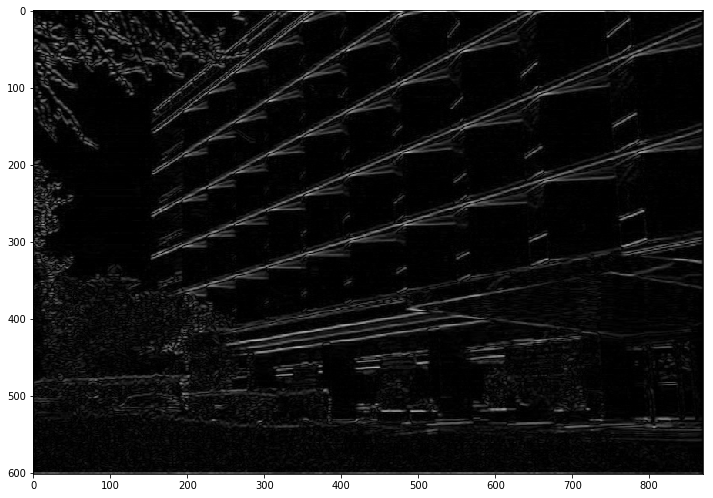

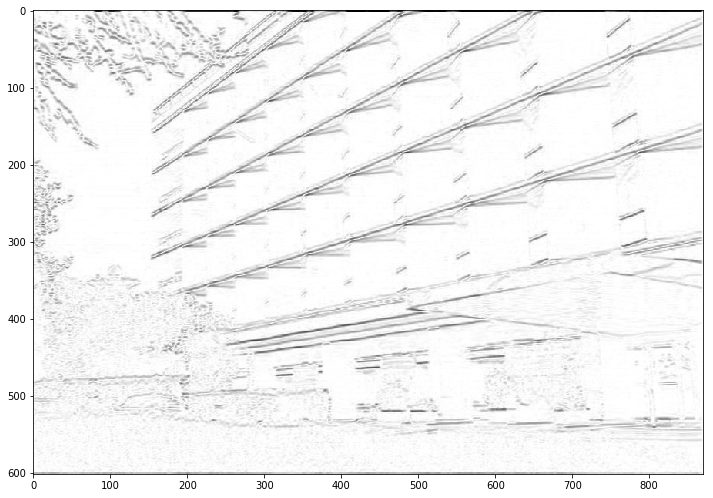

In [16]:
Iy = signal.convolve2d(linesVChannel, Sobely)
plt.figure("Sobel in y direction", figsize=figureSize)
plt.imshow(np.abs(Iy))
plt.set_cmap("gray")
# We can invert the image 
plt.figure("Sobel in y direction (inverted)", figsize=figureSize)
plt.imshow(255-np.abs(Iy))
plt.set_cmap("gray")

## Gradient Magnitude

$$G = \sqrt{Ix^2 + Iy^2}$$


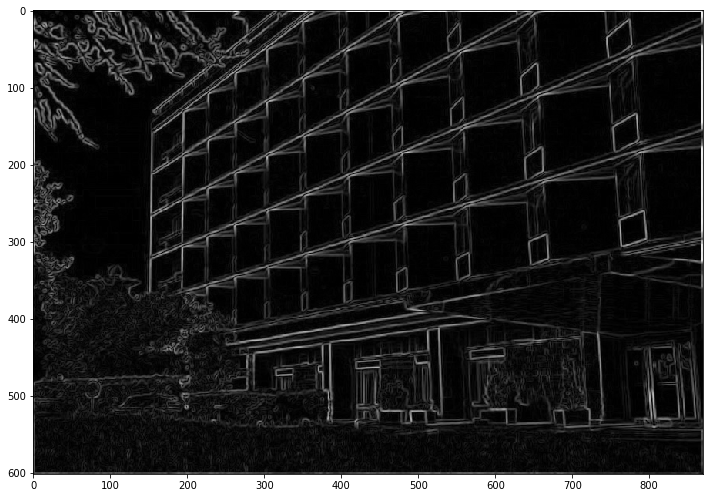

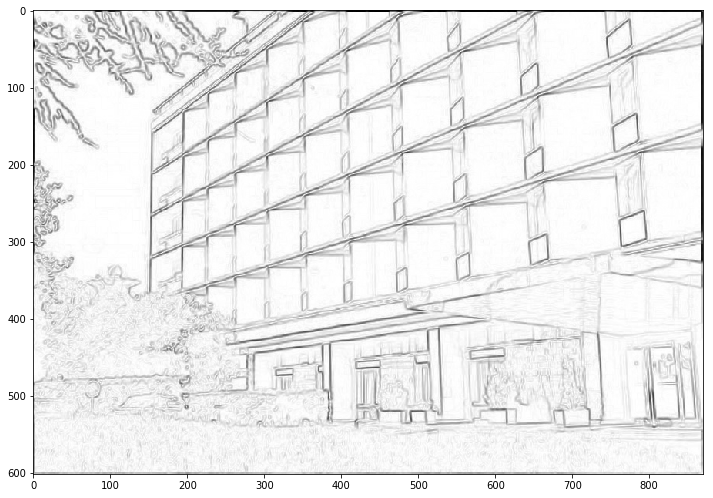

In [17]:
G = np.sqrt(Ix**2 + Iy**2)
plt.figure("Sobel Filter", figsize=figureSize)
plt.imshow(G)
# We can invert the image 
plt.figure("Sobel Filter (inverted)", figsize=figureSize)
plt.imshow(255-G)

## Built in Canny edge detector

Canny is supported by opencv library 

But you have to implement it yourself :)

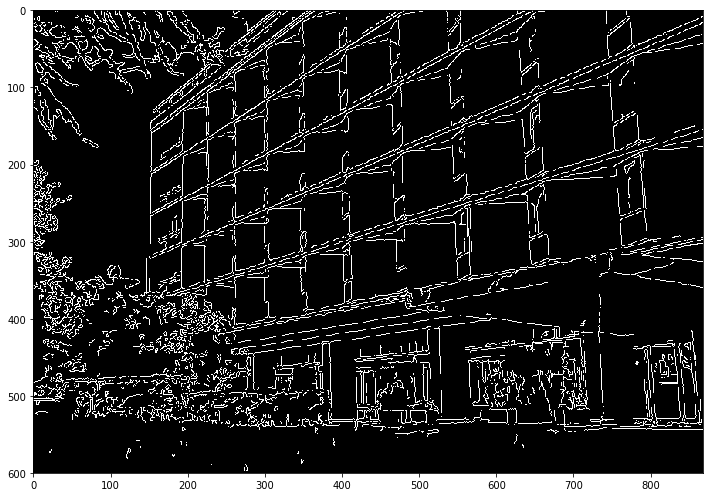

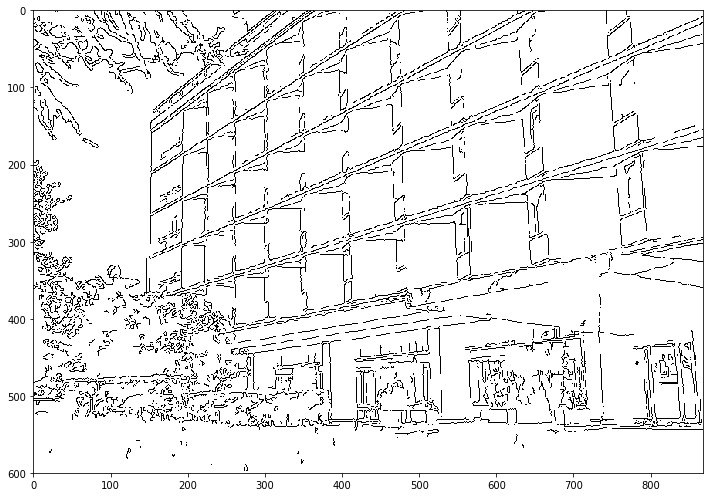

In [18]:
cannyImage = cv2.Canny(np.uint8(linesVChannel),100,200);
plt.figure("Canny Image", figsize=figureSize)
plt.imshow(cannyImage)

## inverted 
plt.figure("Canny Image (inverted)", figsize=figureSize)
plt.imshow(255-cannyImage)